# Importing Libraries

In [1]:
import pandas as pd               # For data manipulation and analysis
import matplotlib.pyplot as plt   # For creating static plots
import seaborn as sns             # For creating more attractive and informative plots
import plotly.express as px       # For creating interactive plots
import psycopg2                   # For connecting to PostgreSQL databases
import os                         # For interacting with the operating system
from dotenv import load_dotenv   # For loading environment variables from a .env file

## Read data

In [2]:
df = pd.read_csv('data/eda.csv')

In [3]:
df.head(2)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,house_id
0,1,3.0,1.00,1180.0,5650.0,1.0,NaN,0.0,3,7,...,1955,0.0,98178,47.5112,-122.257,1340.0,5650.0,2014-10-13,221900.0,7129300520
1,2,3.0,2.25,2570.0,7242.0,2.0,0.0,0.0,3,7,...,1951,19910.0,98125,47.7210,-122.319,1690.0,7639.0,2014-12-09,538000.0,6414100192


In [4]:
df.tail(2)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,house_id
21595,21596,3.0,2.50,1600.0,2388.0,2.0,NaN,0.0,3,8,...,2004,0.0,98027,47.5345,-122.069,1410.0,1287.0,2015-01-16,400000.0,291310100
21596,21597,2.0,0.75,1020.0,1076.0,2.0,0.0,0.0,3,7,...,2008,0.0,98144,47.5941,-122.299,1020.0,1357.0,2014-10-15,325000.0,1523300157


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   bedrooms       21597 non-null  float64
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  float64
 4   sqft_lot       21597 non-null  float64
 5   floors         21597 non-null  float64
 6   waterfront     19206 non-null  float64
 7   view           21534 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  float64
 11  sqft_basement  21145 non-null  float64
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   17749 non-null  float64
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  float64
 18  sqft_l

In [6]:
df.describe()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price,house_id
count,21597.000000,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19206.000000,21534.000000,21597.000000,21597.000000,...,21145.000000,21597.000000,17749.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,2.159700e+04,2.159700e+04
mean,10799.000000,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007602,0.233863,3.409825,7.657915,...,291.857224,1970.999676,836.650516,98077.951845,47.560093,-122.213983,1986.620318,12758.283512,5.402966e+05,4.580474e+09
std,6234.661218,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086858,0.765686,0.650546,1.173200,...,442.490863,29.375234,4000.110554,53.513072,0.138552,0.140724,685.230472,27274.441950,3.673681e+05,2.876736e+09
min,1.000000,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,...,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,7.800000e+04,1.000102e+06
25%,5400.000000,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,...,0.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000,3.220000e+05,2.123049e+09
50%,10799.000000,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,...,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000,4.500000e+05,3.904930e+09
75%,16198.000000,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,...,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,6.450000e+05,7.308900e+09
max,21597.000000,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,...,4820.000000,2015.000000,20150.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,7.700000e+06,9.900000e+09


## Data Cleaning

In [7]:
# Remove unnecessary columns 
df.drop(columns=['id'], inplace=True)

In [8]:
df.isnull().sum()

bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2391
view               63
condition           0
grade               0
sqft_above          0
sqft_basement     452
yr_built            0
yr_renovated     3848
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
date                0
price               0
house_id            0
dtype: int64

In [9]:
# Replace missing values with 0 in the entire DataFrame
df.fillna(0, inplace=True)

# Check for missing values
missing_values = df.isnull().sum()
print(missing_values)

bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
date             0
price            0
house_id         0
dtype: int64


In [10]:
# Check data types to identify continuous and categorical features
print(df.dtypes)

bedrooms         float64
bathrooms        float64
sqft_living      float64
sqft_lot         float64
floors           float64
waterfront       float64
view             float64
condition          int64
grade              int64
sqft_above       float64
sqft_basement    float64
yr_built           int64
yr_renovated     float64
zipcode            int64
lat              float64
long             float64
sqft_living15    float64
sqft_lot15       float64
date              object
price            float64
house_id           int64
dtype: object


* why we are changing data type
  - Data Clarity: If the data in a column represents discrete or categorical values (such as counts, IDs, or labels), using integers can make the data clearer and easier to understand. For example, the number of bedrooms or bathrooms in a house is typically a whole number, so representing them as integers is more appropriate.

In [11]:
#change the data type float into int 
columns_to_convert = ['bedrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 
                      'view', 'sqft_basement', 'yr_renovated', 'sqft_living15', 
                      'sqft_lot15', 'price']

df[columns_to_convert] = df[columns_to_convert].fillna(0).astype(int)

In [12]:
df.nunique()

bedrooms            12
bathrooms           29
sqft_living       1034
sqft_lot          9776
floors               3
waterfront           2
view                 5
condition            5
grade               11
sqft_above         942
sqft_basement      303
yr_built           116
yr_renovated        70
zipcode             70
lat               5033
long               752
sqft_living15      777
sqft_lot15        8682
date               372
price             3622
house_id         21420
dtype: int64

In [13]:
# correcting values with more than 4 digits in the year column
invalid_years = df[df['yr_renovated'].astype(str).str.len() > 4]['yr_renovated']

# Display invalid years
print("Invalid years:")
print(invalid_years)

Invalid years:
1        19910
35       20020
95       19910
103      20100
125      19920
         ...  
19602    20040
20041    20060
20428    20090
20431    20140
20946    20070
Name: yr_renovated, Length: 744, dtype: int64


In [14]:
# Remove the extra digits (considering it's a typo and should be a 4-digit year)
df.loc[df['yr_renovated'].astype(str).str.len() > 4, 'yr_renovated'] = df['yr_renovated'] // 10  # Removes the last digit

# Display the corrected year column
print("\nCorrected year column:")
print(df['yr_renovated'])


Corrected year column:
0           0
1        1991
2           0
3           0
4           0
         ... 
21592       0
21593       0
21594       0
21595       0
21596       0
Name: yr_renovated, Length: 21597, dtype: int64


In [15]:
# Remove duplicate rows
df.drop_duplicates(inplace=True)

In [16]:
# create a new excel file with update
df.to_csv('timothy_stevens_seller_Final.csv', index = True)

## My Client: #Timothy Stevens: Seller 
* Owns expensive houses in the center
* needs to get rid
* best timing within a year
* open for renovation when profits rise

## Hypothesis 1: Location Influence on House Prices
* Houses located in the central area have higher prices compared to houses in the suburbs.
* Justification: Proximity to central areas often correlates with higher demand, leading to increased property values.
* Analysis: Houses in specific zip codes or areas might command higher prices

## Hypothesis 2: Seasonal Timing
* Selling houses during peak real estate seasons (like spring or summer) in the central area results in higher profits.
* Justification: Real estate markets can fluctuate seasonally, with higher demand and prices during certain periods.
* Analysis: Analyzed average house prices monthly and yearly to understand seasonal trends.
* Mapped months to seasons, exploring price trends by season.

## Hypothesis 3: Renovation Impact
* Renovated houses sell at higher prices than non-renovated ones in the same area.
* Justification: Renovations often increase the aesthetic appeal and functionality of a property, potentially leading to increased selling prices.
* Analysis: Explored the impact of renovation by comparing prices for renovated and non-renovated houses in the central area.

# Hypothesis 1:

In [17]:
#find out how many different zip codes are available in your dataset
unique_zipcodes = df['zipcode'].nunique()
print(f"There are {unique_zipcodes} different zip codes available in the dataset.")

There are 70 different zip codes available in the dataset.


In [18]:
# Group data by zip code and analyze mean prices
mean_prices_by_zipcode = df.groupby('zipcode')['price'].mean()
print("\nMean Prices by Zip Code:")
print(mean_prices_by_zipcode)


Mean Prices by Zip Code:
zipcode
98001    2.811949e+05
98002    2.342840e+05
98003    2.941113e+05
98004    1.356524e+06
98005    8.102897e+05
             ...     
98177    6.764194e+05
98178    3.106128e+05
98188    2.890783e+05
98198    3.028967e+05
98199    7.921879e+05
Name: price, Length: 70, dtype: float64


In [19]:
#identifing central_zipcodes from df
#zip code information with latitude ('lat') and longitude ('long')

# Calculate mean latitude and longitude as central coordinates
mean_lat = df['lat'].mean()
mean_long = df['long'].mean()

# Define a range for latitude and longitude to consider as central
lat_range = 0.1  # Adjust this range as needed
long_range = 0.1  # Adjust this range as needed

# Identify zip codes within the defined range of central coordinates
central_zipcodes = df[
    (df['lat'] >= mean_lat - lat_range) & (df['lat'] <= mean_lat + lat_range) &
    (df['long'] >= mean_long - long_range) & (df['long'] <= mean_long + long_range)
]['zipcode'].unique()

print("Zip codes within the central range:", central_zipcodes)

Zip codes within the central range: [98178 98007 98040 98056 98105 98008 98059 98122 98144 98004 98005 98118
 98108 98168 98006 98033 98058 98112 98055 98052 98188 98039 98027 98102]


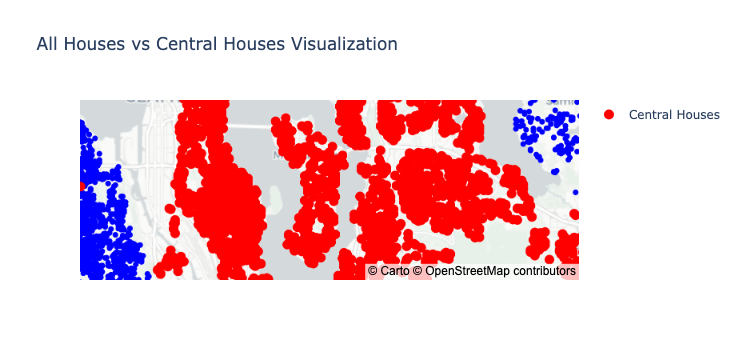

In [20]:
# All Houses vs Central Houses Visualization
import plotly.express as px

# Create separate DataFrames for all houses and central houses
all_houses_df = df
central_houses_df = df[df['zipcode'].isin(central_zipcodes)]

# Create scatter plots for all houses and central houses
fig = px.scatter_mapbox(all_houses_df, lat='lat', lon='long', hover_name='zipcode',
                        color_discrete_sequence=['blue'], zoom=10, mapbox_style='carto-positron',
                        title='All Houses vs Central Houses Visualization')
fig.add_scattermapbox(lat=central_houses_df['lat'], lon=central_houses_df['long'], 
                      hoverinfo='skip', marker=dict(color='red', size=10),
                      name='Central Houses')
fig.show()

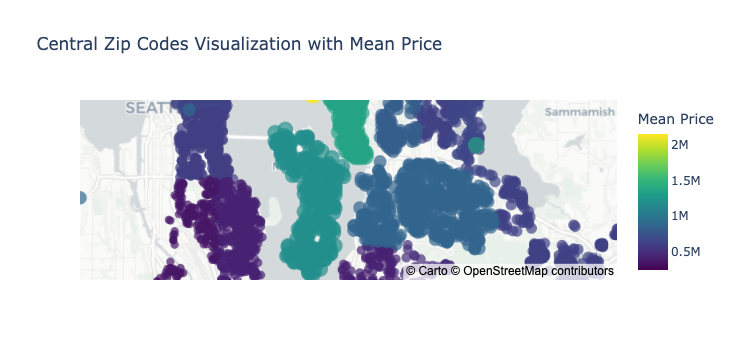

In [21]:
import plotly.express as px

# Assuming 'central_zipcodes' contains the identified central zip codes
# 'df' is your DataFrame containing latitude ('lat'), longitude ('long'), and price information

# Filter the DataFrame for the identified central zip codes
central_df = df[df['zipcode'].isin(central_zipcodes)]

# Calculate the mean price for each zip code
mean_price_by_zip = central_df.groupby('zipcode')['price'].mean().reset_index()

# Merge mean prices back into the central DataFrame
central_df = central_df.merge(mean_price_by_zip, on='zipcode', suffixes=('', '_mean'))

# Create a scatter plot with Plotly Express
fig = px.scatter_mapbox(central_df, lat='lat', lon='long', hover_name='zipcode', 
                        color='price_mean', size='price_mean', 
                        color_continuous_scale='Viridis',
                        size_max=15, zoom=10, mapbox_style='carto-positron',
                        title='Central Zip Codes Visualization with Mean Price',
                        labels={'price_mean': 'Mean Price'})
fig.show()


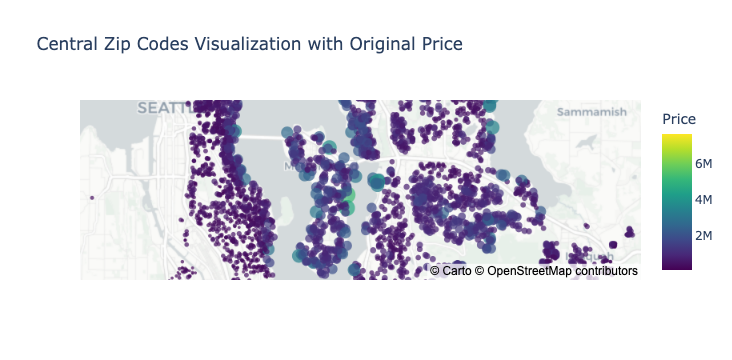

In [22]:
import plotly.express as px

# Assuming 'central_zipcodes' contains the identified central zip codes
# 'df' is your DataFrame containing latitude ('lat'), longitude ('long'), and price information

# Filter the DataFrame for the identified central zip codes
central_df = df[df['zipcode'].isin(central_zipcodes)]

# Create a scatter plot with Plotly Express using the original price
fig = px.scatter_mapbox(central_df, lat='lat', lon='long', hover_name='zipcode', 
                        color='price', size='price', 
                        color_continuous_scale='Viridis',
                        size_max=15, zoom=10, mapbox_style='carto-positron',
                        title='Central Zip Codes Visualization with Original Price',
                        labels={'price': 'Price'})
fig.show()

In [23]:
# Group by 'zipcode' and calculate the sum of 'view' for each zip code
views_by_central_zipcode = central_df.groupby('zipcode')['view'].sum().reset_index().sort_values(by='view', ascending=False)

# Display the total views for each central zip code
print(views_by_central_zipcode)

    zipcode  view
2     98006   314
8     98040   216
20    98144   146
22    98178   140
4     98008   135
6     98033   129
18    98118   129
0     98004    97
11    98056    71
15    98105    70
5     98027    64
19    98122    61
17    98112    40
9     98052    37
10    98055    28
7     98039    22
23    98188    20
13    98059    20
16    98108    18
14    98102    16
1     98005    16
12    98058    10
21    98168     4
3     98007     4


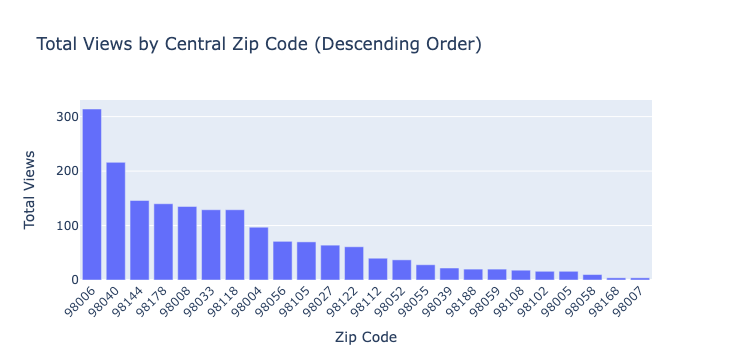

In [24]:
import plotly.express as px

# Sort the DataFrame by 'view' column in descending order
views_by_central_zipcode_sorted = views_by_central_zipcode.sort_values(by='view', ascending=False)

# Create a bar plot using Plotly Express
fig = px.bar(views_by_central_zipcode_sorted, x='zipcode', y='view',
             title='Total Views by Central Zip Code (Descending Order)',
             labels={'zipcode': 'Zip Code', 'view': 'Total Views'})

# Rotate the x-axis labels for better readability
fig.update_layout(xaxis_tickangle=-45)

# Ensure 'zipcode' is treated as a categorical variable
fig.update_xaxes(type='category')

fig.show()


# Hypothesis 2:

In [25]:
central_df.head(2)

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,house_id
0,3,1.0,1180,5650,1,0,0,3,7,1180.0,...,1955,0,98178,47.5112,-122.257,1340,5650,2014-10-13,221900,7129300520
10,3,2.5,3560,9796,1,0,0,3,8,1860.0,...,1965,0,98007,47.6007,-122.145,2210,8925,2015-04-03,662500,1736800520


In [29]:
# Convert 'date' column to datetime type
central_df.loc[:, 'date'] = pd.to_datetime(central_df['date'], errors='coerce')

# Extract month from 'date' column
central_df.loc[:, 'month'] = central_df['date'].dt.month

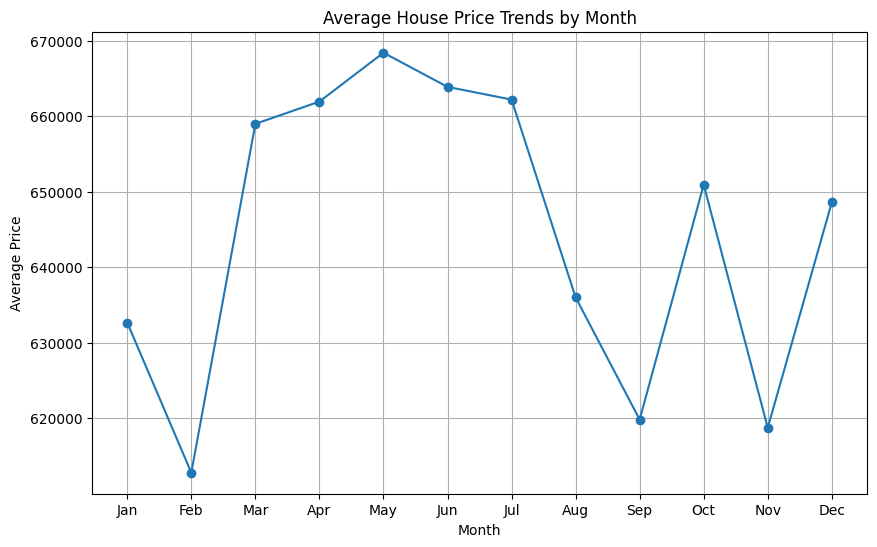

In [30]:
# Aggregate prices by month
monthly_prices = central_df.groupby('month')['price'].mean()

# Visualize monthly price trends
plt.figure(figsize=(10, 6))
monthly_prices.plot(marker='o')
plt.title('Average House Price Trends by Month')
plt.xlabel('Month')
plt.ylabel('Average Price')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.show()

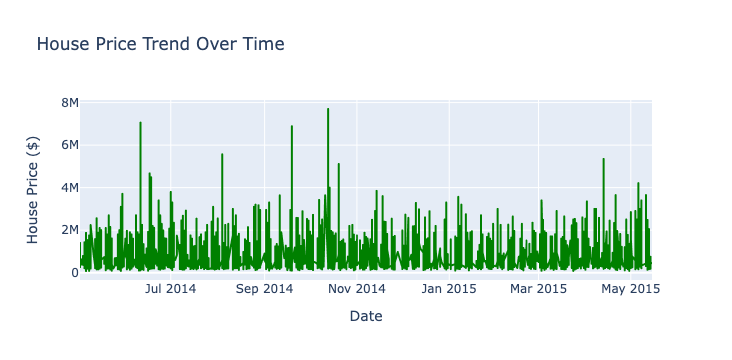

In [31]:
import plotly.express as px

# Assuming 'central_df' contains the DataFrame with house prices and dates

# Convert 'date' column to datetime type using .loc
central_df.loc[:, 'date'] = pd.to_datetime(central_df['date'])

# Sort the DataFrame by date using .loc
central_df = central_df.sort_values(by='date')

# Plot the price trend over time using Plotly Express
fig = px.line(central_df, x='date', y='price', title='House Price Trend Over Time', color_discrete_sequence=['green'])
fig.update_layout(xaxis_title='Date', yaxis_title='House Price ($)')
fig.show()

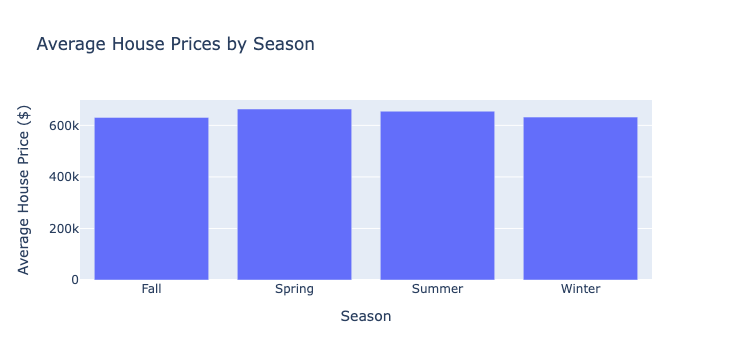

In [32]:
import pandas as pd
import plotly.express as px

# Assuming 'central_df' contains the DataFrame with house prices and dates

# Convert 'date' column to datetime type
central_df['date'] = pd.to_datetime(central_df['date'])

# Define a function to extract the season from the date
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

# Extract season from 'date' column
central_df['season'] = central_df['date'].dt.month.apply(get_season)

# Group by season and calculate average house price
average_prices_seasonal = central_df.groupby('season')['price'].mean().reset_index()

# Plot the data using Plotly Express
fig = px.bar(average_prices_seasonal, x='season', y='price', title='Average House Prices by Season')
fig.update_layout(xaxis_title='Season', yaxis_title='Average House Price ($)')
fig.show()


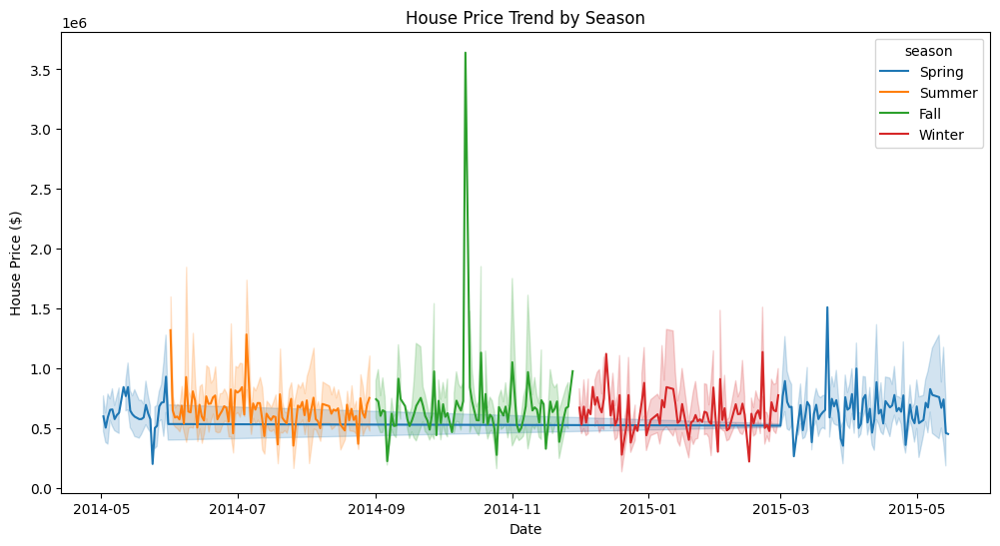

In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'central_df' contains the DataFrame with house prices and dates

# Convert 'date' column to datetime type
central_df['date'] = pd.to_datetime(central_df['date'])

# Extract the month to create a 'season' column
central_df['season'] = central_df['date'].dt.month.map({1: 'Winter', 2: 'Winter', 3: 'Spring', 4: 'Spring', 5: 'Spring', 6: 'Summer', 7: 'Summer', 8: 'Summer', 9: 'Fall', 10: 'Fall', 11: 'Fall', 12: 'Winter'})

# Sort the DataFrame by date
central_df = central_df.sort_values(by='date')

# Plot the trend by season using seaborn
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='price', hue='season', data=central_df)
plt.title('House Price Trend by Season')
plt.xlabel('Date')
plt.ylabel('House Price ($)')
plt.show()


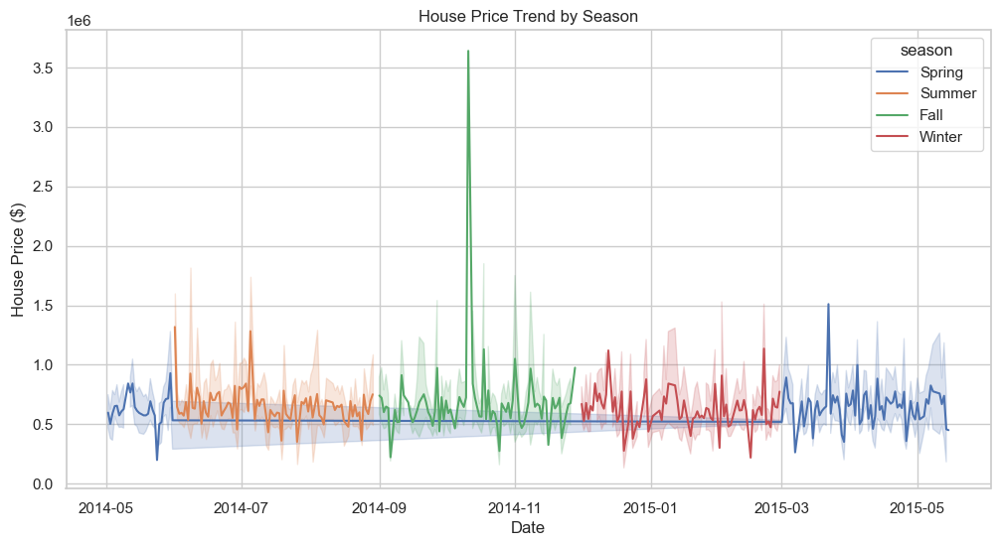

In [34]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'central_df' contains the DataFrame with house prices and dates

# Convert 'date' column to datetime type
central_df['date'] = pd.to_datetime(central_df['date'])

# Extract season from 'date' column
central_df['season'] = central_df['date'].dt.month.map({1: 'Winter', 2: 'Winter', 3: 'Spring', 4: 'Spring', 5: 'Spring',
                                                        6: 'Summer', 7: 'Summer', 8: 'Summer', 9: 'Fall', 10: 'Fall',
                                                        11: 'Fall', 12: 'Winter'})

# Sort the DataFrame by date
central_df = central_df.sort_values(by='date')

# Set the style for the plot
sns.set(style="whitegrid")

# Plot the trend by season using seaborn
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='price', hue='season', data=central_df)
plt.title('House Price Trend by Season')
plt.xlabel('Date')
plt.ylabel('House Price ($)')
plt.show()

# Hypothesis: 3  

In [35]:
central_houses = central_df[central_df['zipcode'].isin(central_zipcodes)]

# Categorize houses based on renovation status
central_houses['renovated'] = central_houses['yr_renovated'] > 0

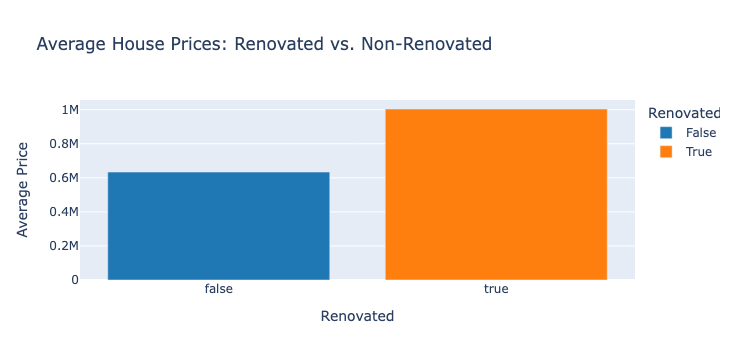

In [36]:
# Analyze average prices for renovated and non-renovated houses
renovated_prices = central_houses.groupby('renovated')['price'].mean().reset_index()

# Visualize the impact of renovation on house prices using Plotly Express
fig = px.bar(renovated_prices, x='renovated', y='price', 
             title='Average House Prices: Renovated vs. Non-Renovated',
             labels={'renovated': 'Renovated', 'price': 'Average Price'},
             color='renovated', color_discrete_sequence=['#1f77b4', '#ff7f0e'])
fig.show()

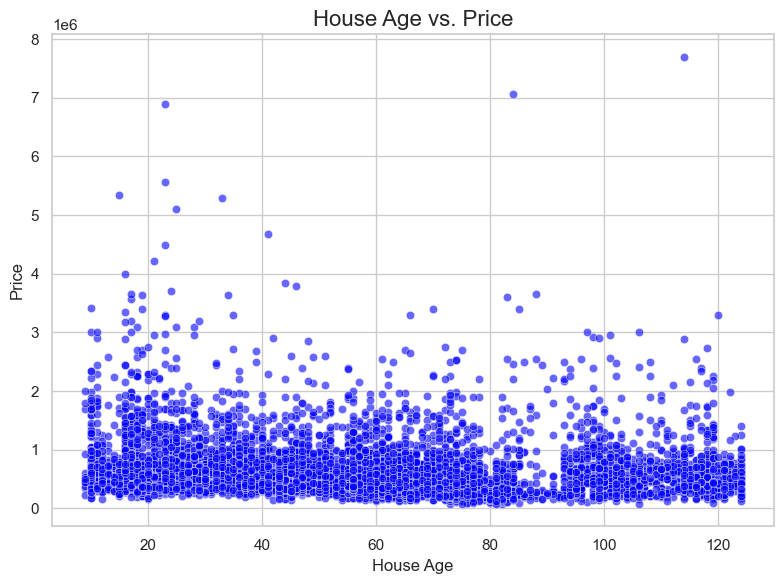

In [37]:
# Calculate house age based on the current year
current_year = pd.Timestamp.now().year
central_df['house_age'] = current_year - central_df['yr_built']

# Plot the scatter plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x='house_age', y='price', data=central_df, alpha=0.6, color='blue')
plt.title('House Age vs. Price', fontsize=16)
plt.xlabel('House Age', fontsize=12)
plt.ylabel('Price', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()